In [1]:
from azureml.core import Workspace

ws = Workspace.from_config()
ds = ws.datastores["workspaceblobstore"]

container_name = ds.container_name
storage_options = {"account_name": ds.account_name, "account_key": ds.account_key}

If you run your code in unattended mode, i.e., where you can't give a user input, then we recommend to use ServicePrincipalAuthentication or MsiAuthentication.
Please refer to aka.ms/aml-notebook-auth for different authentication mechanisms in azureml-sdk.


In [2]:
from adlfs import AzureBlobFileSystem as abfs

fs = abfs(**storage_options)
fs

In [3]:
fs.ls(f"{container_name}/example-data/mnist")

['azureml-blobstore-219ddb3b-39aa-417c-86ce-4a5051bf25c6/example-data/mnist/X_test.npy',
 'azureml-blobstore-219ddb3b-39aa-417c-86ce-4a5051bf25c6/example-data/mnist/X_train.npy',
 'azureml-blobstore-219ddb3b-39aa-417c-86ce-4a5051bf25c6/example-data/mnist/testing.npy',
 'azureml-blobstore-219ddb3b-39aa-417c-86ce-4a5051bf25c6/example-data/mnist/y_test.npy',
 'azureml-blobstore-219ddb3b-39aa-417c-86ce-4a5051bf25c6/example-data/mnist/y_train.npy']

## Load numpy arrays using `np.load`

In [4]:
image_size = 28
train_len = 60000
test_len = 10000

In [5]:
import numpy as np

with fs.open(f"{container_name}/example-data/mnist/X_train.npy", "rb") as f:
    X_train = np.load(f)

with fs.open(f"{container_name}/example-data/mnist/y_train.npy", "rb") as f:
    y_train = np.load(f)

with fs.open(f"{container_name}/example-data/mnist/X_test.npy", "rb") as f:
    X_test = np.load(f)

with fs.open(f"{container_name}/example-data/mnist/y_test.npy", "rb") as f:
    y_test = np.load(f)

## Verify expected results

In [6]:
from random import randint

i = randint(0, train_len)
x = X_train[i]
y = y_train[i]

Text(0.5, 1.0, 'Label: 5')

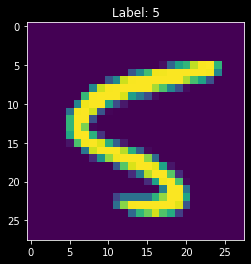

In [7]:
import matplotlib.pyplot as plt

plt.style.use("dark_background")

plt.imshow(x.squeeze())
plt.title(f"Label: {y}")

In [8]:
X_train = X_train.reshape(train_len, image_size*image_size)
X_test = X_test.reshape(test_len, image_size*image_size)

In [9]:
import lightgbm as lgbm

params = {
    "num_iterations": 100,
    "learning_rate": 0.1,
    "seed": 42,
}

model = lgbm.LGBMClassifier(**params)
model

LGBMClassifier(num_iterations=100, seed=42)

In [10]:
model = model.fit(X_train, y_train)

/usr/local/lib/python3.8/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


In [11]:
y_pred = model.predict(X_test)
y_pred

array([7, 2, 1, ..., 4, 5, 6], dtype=uint8)

In [12]:
sum(y_test == y_pred) / test_len

0.9774

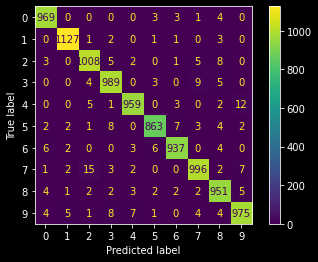

In [13]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(model, X_test, y_test)

In [14]:
from sklearn.decomposition import PCA

n_components = 28

pca = PCA(n_components=n_components)
pca.fit(X_train)

PCA(n_components=28)

(0.0, 1.0)

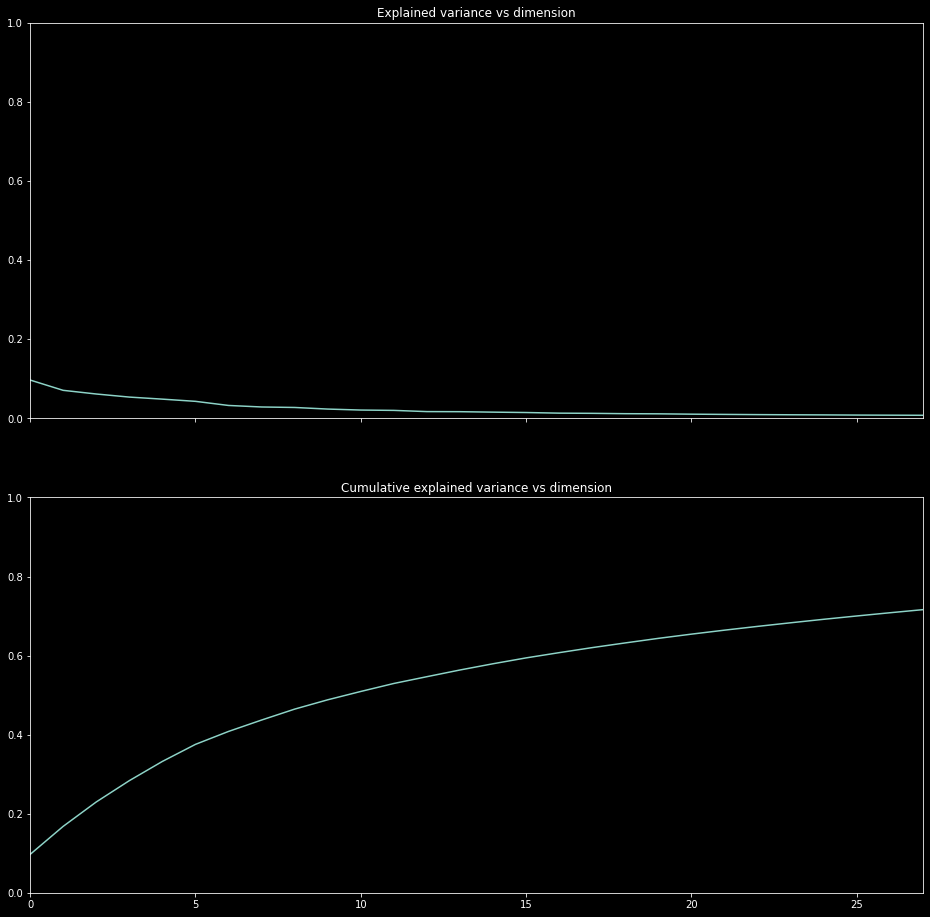

In [15]:
fig, axs = plt.subplots(2, figsize=(16, 16), sharex=True, sharey=True)

axs[0].plot(pca.explained_variance_ratio_)
axs[0].set_title("Explained variance vs dimension")

axs[1].plot(np.cumsum(pca.explained_variance_ratio_))
axs[1].set_title("Cumulative explained variance vs dimension")

plt.xlim([0, n_components-1])
plt.ylim([0, 1])

In [16]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

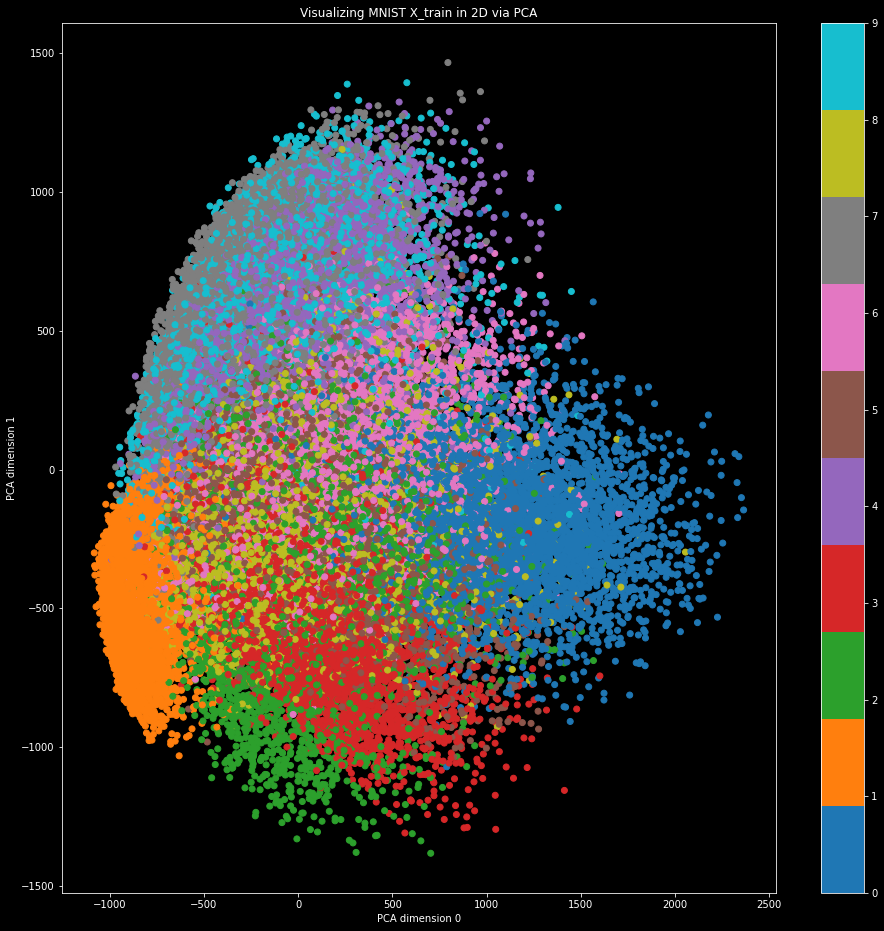

In [24]:
fig = plt.figure(figsize=(16, 16))

plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap="tab10")

plt.xlabel("PCA dimension 0")
plt.ylabel("PCA dimension 1")
plt.title("Visualizing MNIST X_train in 2D via PCA")
plt.colorbar()

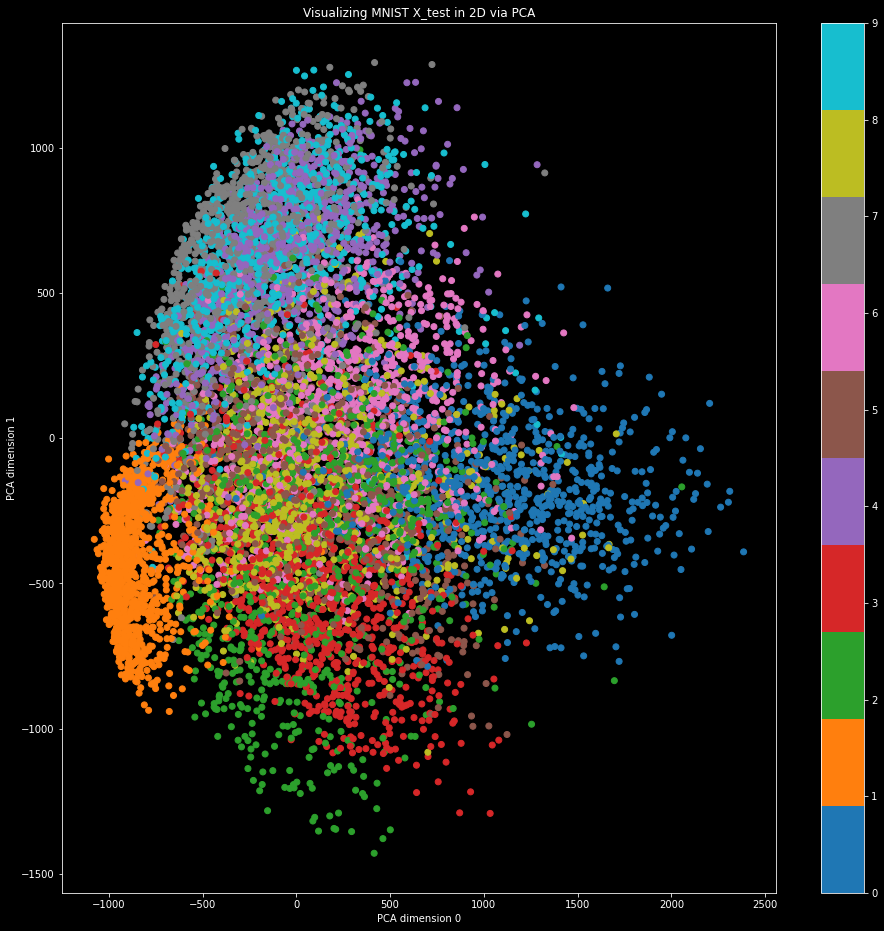

In [25]:
fig = plt.figure(figsize=(16, 16))

plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, cmap="tab10")

plt.xlabel("PCA dimension 0")
plt.ylabel("PCA dimension 1")
plt.title("Visualizing MNIST X_test in 2D via PCA")
plt.colorbar()

In [19]:
params = {
    "num_iterations": 100,
    "learning_rate": 0.1,
    "seed": 42,
}

model_pca = lgbm.LGBMClassifier(**params)
model_pca

LGBMClassifier(num_iterations=100, seed=42)

In [20]:
model_pca = model_pca.fit(X_train_pca, y_train)

/usr/local/lib/python3.8/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


In [21]:
y_pred = model_pca.predict(X_test_pca)
y_pred

array([7, 2, 1, ..., 4, 5, 6], dtype=uint8)

In [22]:
sum(y_test == y_pred) / test_len

0.9629

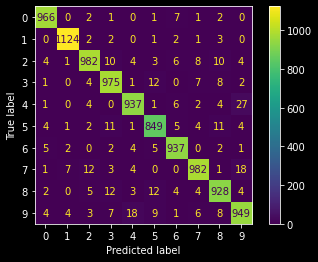

In [23]:
plot_confusion_matrix(model_pca, X_test_pca, y_test)